<p style="font-family:'Segoe UI';font-size:20px;color:white;background-color:purple"><br><b>Assignment on GBDT</b><br><br>
Student name: Muhammad Iqbal Bazmi<br><br></p>

#### importing necessary libraries

In [1]:
import warnings
warnings.filterwarnings("ignore") # Ignore the Warnings

import sqlite3  # Lite database
import pandas as pd # Data processing
import numpy as np # Numerical Processing
import nltk # Natural Language Toolkit
import string # for strong processing
import matplotlib.pyplot as plt
import seaborn as sns # For visualization top on Matplotlib

# Text pre-processing using TFIDF concept
# TFIDF => Term Frequency- Inverse Document Frequency
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

# Text processing using BOW (Bag Of Words)
from sklearn.feature_extraction.text import CountVectorizer

# Metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc

# Stemming of word using PorterStemmer 
from nltk.stem.porter import PorterStemmer
# Lemmatization of word using WordNetLemmatizer
from nltk.stem.wordnet import WordNetLemmatizer

# regular expression
import re

# stopwords
from nltk.corpus import stopwords


# Gensim models ###############
###############################

# change word to dense Vector
from gensim.models import Word2Vec
from gensim.models import KeyedVectors

# to save the variable
import pickle

# to visualize the processing 
from tqdm import tqdm

# operating system operation
import os

# Visualizations
from chart_studio import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()

# Counter
from collections import Counter

## 1. Loading Data

In [2]:
data  = pd.read_csv('preprocessed_data.csv')
# data  = pd.read_csv('preprocessed_data.csv', nrows=50000) # you can take less number of rows like this
# I have preprocessed whole dataset but it is taking a lot of time when using BOW, and TFIDF. so , finally, I decide to use 
# just 35K datapoints in training because of I have resource constrained laptop.
# Thanks in advance to understand
data.head(2)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,project_is_approved,clean_categories,clean_subcategories,essay,price
0,nv,ms,grades_prek_2,26,1,literacy_language,literacy,kindergarten students come low income househol...,299.98
1,ga,mrs,grades_3_5,1,0,music_arts_health_sports,performingarts_teamsports,elementary school culturally rich school diver...,20.00


In [3]:
class_distribution = dict(data['project_is_approved'].value_counts())
class_distribution

{1: 154346, 0: 27734}

Text(0.5, 1.0, 'Distribution of classes')

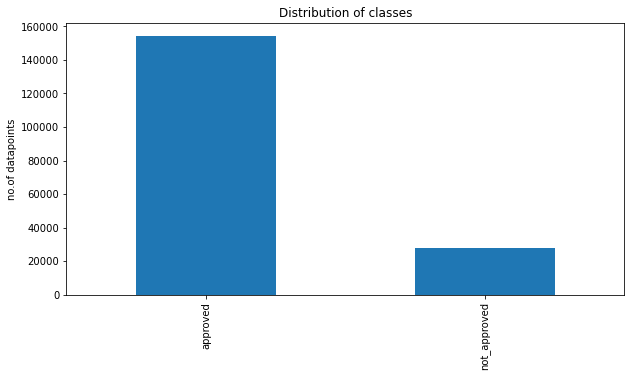

In [4]:
plt.figure(figsize=(10,5))
data['project_is_approved'].value_counts().plot(kind='bar')
plt.xticks([0,1],['approved','not_approved'])
plt.ylabel('no.of datapoints')
plt.title('Distribution of classes')

## 1.2 Splitting into Train and Test dataset

In [5]:
x_columns = list(data.columns)
x_columns.remove('project_is_approved')

In [6]:
x_columns

['school_state',
 'teacher_prefix',
 'project_grade_category',
 'teacher_number_of_previously_posted_projects',
 'clean_categories',
 'clean_subcategories',
 'essay',
 'price']

In [7]:
# importing necessary libraries
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(data[x_columns], data['project_is_approved'], test_size=0.2, random_state=42)

# 2. Vectorizing Text data
**For both Train and Test**

## 2.1 Bag of words

In [8]:
preprocessed_essays_train = X_train['essay'].values
preprocessed_essays_test  = X_test['essay'].values

In [9]:
# We are considering only the words which appeared in at least 10 documents(rows or projects).
vectorizer = CountVectorizer(min_df=10)
text_bow_train = vectorizer.fit_transform(preprocessed_essays_train)
text_bow_test  = vectorizer.transform(preprocessed_essays_test)
print("Shape of train matrix after one hot encodig ",text_bow_train.shape)
print("Shape of test matrix after one hot encoding ", text_bow_test.shape)

Shape of train matrix after one hot encodig  (145664, 18388)
Shape of test matrix after one hot encoding  (36416, 18388)


In [10]:
# you can vectorize the title also 
# before you vectorize the title make sure you preprocess it

## 2.2 TFIDF vectorizer

In [11]:
%%time
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=10)
text_tfidf_train = vectorizer.fit_transform(preprocessed_essays_train)
text_tfidf_test = vectorizer.transform(preprocessed_essays_test)
print("Shape of matrix of train data after TFIDF encodig ",text_tfidf_train.shape)
print("Shape of matrix of test data after TFIDF encoding", text_tfidf_test.shape)

Shape of matrix of train data after TFIDF encodig  (145664, 18388)
Shape of matrix of test data after TFIDF encoding (36416, 18388)
Wall time: 30.5 s


## 2.3 Using Pretrained Models: Avg W2V

In [12]:
'''
# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039
def loadGloveModel(gloveFile):
    print ("Loading Glove Model")
    f = open(gloveFile,'r', encoding="utf8")
    model = {}
    for line in tqdm(f):
        splitLine = line.split()
        word = splitLine[0]
        embedding = np.array([float(val) for val in splitLine[1:]])
        model[word] = embedding
    print ("Done.",len(model)," words loaded!")
    return model
model = loadGloveModel('glove.42B.300d.txt')

# ============================
Output:
    
Loading Glove Model
1917495it [06:32, 4879.69it/s]
Done. 1917495  words loaded!

# ============================

words = []
for i in preproced_texts:
    words.extend(i.split(' '))

for i in preproced_titles:
    words.extend(i.split(' '))
print("all the words in the coupus", len(words))
words = set(words)
print("the unique words in the coupus", len(words))

inter_words = set(model.keys()).intersection(words)
print("The number of words that are present in both glove vectors and our coupus", \
      len(inter_words),"(",np.round(len(inter_words)/len(words)*100,3),"%)")

words_courpus = {}
words_glove = set(model.keys())
for i in words:
    if i in words_glove:
        words_courpus[i] = model[i]
print("word 2 vec length", len(words_courpus))


# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/

import pickle
with open('glove_vectors', 'wb') as f:
    pickle.dump(words_courpus, f)


'''

'\n# Reading glove vectors in python: https://stackoverflow.com/a/38230349/4084039\ndef loadGloveModel(gloveFile):\n    print ("Loading Glove Model")\n    f = open(gloveFile,\'r\', encoding="utf8")\n    model = {}\n    for line in tqdm(f):\n        splitLine = line.split()\n        word = splitLine[0]\n        embedding = np.array([float(val) for val in splitLine[1:]])\n        model[word] = embedding\n    print ("Done.",len(model)," words loaded!")\n    return model\nmodel = loadGloveModel(\'glove.42B.300d.txt\')\n\n# ============================\nOutput:\n    \nLoading Glove Model\n1917495it [06:32, 4879.69it/s]\nDone. 1917495  words loaded!\n\n# ============================\n\nwords = []\nfor i in preproced_texts:\n    words.extend(i.split(\' \'))\n\nfor i in preproced_titles:\n    words.extend(i.split(\' \'))\nprint("all the words in the coupus", len(words))\nwords = set(words)\nprint("the unique words in the coupus", len(words))\n\ninter_words = set(model.keys()).intersection(word

In [13]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file
with open('glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

Avg W2V for Train data

In [14]:
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors_train = []; # the avg-w2v for each sentence/review is stored in this list of train dataset
for sentence in tqdm(preprocessed_essays_train): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_train.append(vector)

print(len(avg_w2v_vectors_train))
print(len(avg_w2v_vectors_train[0])) # vector size

100%|████████████████████████████████████████████████████████████████████████| 145664/145664 [01:06<00:00, 2199.17it/s]

145664
300


AVG W2V for the test dataset

In [15]:
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors_test = []; # the avg-w2v for each sentence/review is stored in this list of train dataset
for sentence in tqdm(preprocessed_essays_test): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_test.append(vector)

print(len(avg_w2v_vectors_test))
print(len(avg_w2v_vectors_test[0])) # vector size

100%|██████████████████████████████████████████████████████████████████████████| 36416/36416 [00:13<00:00, 2609.16it/s]

36416
300


## 2.4 Using Pretrained Models: TFIDF weighted W2V

In [16]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer()
tfidf_model.fit(preprocessed_essays_train)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [17]:
# average Word2Vec
# compute average word2vec for each review.
tfidf_w2v_vectors_train = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_essays_train): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_train.append(vector)

print(len(tfidf_w2v_vectors_train))
print(len(tfidf_w2v_vectors_train[0]))

100%|█████████████████████████████████████████████████████████████████████████| 145664/145664 [06:58<00:00, 348.46it/s]

145664
300


In [18]:
# average Word2Vec for test dataset
# compute average word2vec for each review.
tfidf_w2v_vectors_test = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(preprocessed_essays_test): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_test.append(vector)

print(len(tfidf_w2v_vectors_test))
print(len(tfidf_w2v_vectors_test[0]))

100%|███████████████████████████████████████████████████████████████████████████| 36416/36416 [01:34<00:00, 385.96it/s]

36416
300


# 2. Vectorizing Categorical Features

In [19]:
def response_coding_train(data, y):
    '''
    data : data on which response coding will be performed (Should be in pd.Series format)
    
    y: label of the data
    
    return:
        It return two values in numpy.ndarray form:
            1. response encoded data 
            2. unique elements probability to encode test data.
    '''
#     !pip install tqdm
    from tqdm import tqdm
    from collections import Counter
    
    response_data = [] # list to store response data
    
    # check how many classes are there in y
    unique_y = set(y)
    
    # find unique elements in data
    unique_data = set(data)
    unique_data_counter = Counter(data)
    
    
    unique_data_prob = [] # list to store probability score of unique data
    
    def custom_count(t, condition_value, data, y):
        count = 0
        for i in range(len(data)):
            if t==data.iloc[i] and y.iloc[i]==condition_value: # y.iloc because y is Series
                count+=1
        return count
        
    for i in range(len(unique_data)): # for each unique data value we will store thier probability score 
        prob_list = [] # list to store prob score for each class
        for j in range(len(unique_y)):
            count = custom_count(list(unique_data)[i], list(unique_y)[j], data, y)
            prob_list.append(count/list(unique_data_counter.values())[i])
        unique_data_prob.append(prob_list)
        
    
    final_output = []
    for i in range(len(data)):
        for j in range(len(unique_data)):
            if data.iloc[i] == list(unique_data)[j]:
                final_output.append(unique_data_prob[j])
                break
    assert(len(final_output) == len(data))
    unique_data_probability = zip(unique_data,unique_data_prob)
    return np.array(final_output), unique_data_probability
# def response_coding_test(test_data, unique_data_prob)

In [20]:
def response_coding_test(test_data, prob):
    test_data = list(test_data)
    prob = list(prob) # typecast to list
    result = [] # to store probability of 
    for i in range(len(test_data)):
        count = 0
        for j in range(len(prob)):
            if test_data[i] == prob[j][0]:
                result.append(prob[j][1])
                break
            count+=1
        if count>=len(prob):# if there is no probability score for test dataset
            t = [0.5, 0.5]
            result.append(t)

    return np.array(result)

In [21]:
%%time
# response encoding of 'school_state' feature
school_state_response_train, prob_school_state = response_coding_train(X_train['school_state'], y_train)
school_state_response_test  = response_coding_test(X_test['school_state'], prob_school_state)
print("Shape of matrix of 'school_state' of train dataset after response encoding ",school_state_response_train.shape)
print("Shape of matrix of 'school_state' of test dataset after response encoding",school_state_response_test.shape)

Shape of matrix of 'school_state' of train dataset after response encoding  (145664, 2)
Shape of matrix of 'school_state' of test dataset after response encoding (36416, 2)
Wall time: 2min 11s


In [22]:
%%time
# response encoding 'teacher_prefix' feature
teacher_prefix_response_train, prob_teacher_prefix = response_coding_train(X_train['teacher_prefix'], y_train)
teacher_prefix_response_test = response_coding_test(X_test['teacher_prefix'], prob_teacher_prefix)
print("teacher_prefix_response_coding**********************")
print("Shape of matrix of train dataset after response encoding ",teacher_prefix_response_train.shape)
print("Shape of matrix of test dataset after response encoding ",teacher_prefix_response_test.shape)

teacher_prefix_response_coding**********************
Shape of matrix of train dataset after response encoding  (145664, 2)
Shape of matrix of test dataset after response encoding  (36416, 2)
Wall time: 16 s


In [23]:
%%time
# response encoding 'project_grade_category'
project_grade_category_response_train,  prob_project_grade_category= response_coding_train(X_train['project_grade_category'], y_train)
project_grade_category_response_test  = response_coding_test(X_test['project_grade_category'], prob_project_grade_category)

print("project_grade_category_response encoding *********************")
print("Shape of matrix of train data after response encoding ",project_grade_category_response_train.shape)
print("Shape of matrix of test data after response encoding",project_grade_category_response_test.shape)

project_grade_category_response encoding *********************
Shape of matrix of train data after response encoding  (145664, 2)
Shape of matrix of test data after response encoding (36416, 2)
Wall time: 13.7 s


In [24]:
%%time
# response encoding 'clean_categories'
clean_categories_response_train, prob_clean_categories = response_coding_train(X_train['clean_categories'], y_train)
clean_categories_response_test  = response_coding_test(X_test['clean_categories'], prob_clean_categories)

print('clean_categories_response encoding *****************')
print("Shape of matrix of train data after resposne encoding :",clean_categories_response_train.shape)
print("Shape of matrix of test data after response encoding :",clean_categories_response_test.shape)

clean_categories_response encoding *****************
Shape of matrix of train data after resposne encoding : (145664, 2)
Shape of matrix of test data after response encoding : (36416, 2)
Wall time: 2min 25s


In [25]:
%%time
# vectorizing 'clean_subcategories'
clean_subcategories_response_train, prob_clean_subcategories = response_coding_train(X_train['clean_subcategories'], y_train)
clean_subcategories_response_test  = response_coding_test(X_test['clean_subcategories'], prob_clean_subcategories)

print("clean_subcategories_response encoding")
print("Shape of matrix of train data after response encodig ",clean_subcategories_response_train.shape)
print("Shape of matrix of test data after response encoding : ",clean_subcategories_response_test.shape)

clean_subcategories_response encoding
Shape of matrix of train data after response encodig  (145664, 2)
Shape of matrix of test data after response encoding :  (36416, 2)
Wall time: 20min 31s


### Let's calculate Sentiment scores of essay

    sentiment scores of preprocessed_essays_train (Training dataset)

In [26]:
# a random essay example of train dataset
preprocessed_essays_train[0]

'positive attitudes love music success music underprivileged districts faces truly inspiration district begins playing instrument 7th grade far behind districts 3 4 years students already starting disadvantage yet students still appreciative get chance succeed amazing competitions given chance want best experience possible limited materials please help fund project future musicians grateful project storage shelves violins currently 25 violins placed corners room floor top file cabinets extremely unsafe keep instruments no place put classroom short storage areas shelves allow students set safe place put instruments project funded would allow instruments not kicked tripped dropped constantly saving violins also thesenannan'

<pre>Let's start finding sentiment scores

In [27]:
import nltk # Natural Language ToolKit library
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\localadmin\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [28]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

sid = SentimentIntensityAnalyzer()

sentiment_list_train = [] # list to store sentiments
for i in tqdm(range(len(preprocessed_essays_train))): # for every essay in preprocessed_essays
    essay = preprocessed_essays_train[i]
    
    ss = sid.polarity_scores(essay)
    
    temp = [] # temporary list to store all four columns['neg','neutral','pos','compound']
    
    for k in ss:
        temp.append(ss[k])
        
    sentiment_list_train.append(temp) 

100%|█████████████████████████████████████████████████████████████████████████| 145664/145664 [05:29<00:00, 442.50it/s]


In [29]:
# an example of sentiment score
sentiment_list_train[0]

[0.051, 0.536, 0.413, 0.9929]

In [30]:
sentiment_list_array_train = np.array(sentiment_list_train)

    sentiment scores of preprocessed_essays_test (Test dataset)

In [31]:
# a random essay example of train dataset
preprocessed_essays_test[0]

'grind together shine together el reno girls basketball contender every year 5a state championship however girls need consistency discipline commitment approximately 30 girls participating high school basketball girls eager get better want work hard takes last team playing end year high population native americans caucasians school classified 57th biggest high school state anyone relate jumping rope athletes many benefits jumping rope imagine pain conditioning could receive weighted jump rope girls basketball program could competitive first many projects build competitive program girls basketball team required jump rope everyday 10 minutes practice starts jump ropes help tremendously comes getting girls shape high school girls basketball program lot last 2 years girls need want commitment dedication discipline potential expectations time high donations project show young ladies important success really family friends community'

<pre>Let's start finding sentiment scores

In [32]:
import nltk # Natural Language ToolKit library
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\localadmin\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [33]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

sid = SentimentIntensityAnalyzer()

sentiment_list_test = [] # list to store sentiments
for i in tqdm(range(len(preprocessed_essays_test))): # for every essay in preprocessed_essays
    essay = preprocessed_essays_test[i]
    
    ss = sid.polarity_scores(essay)
    
    temp = [] # temporary list to store all four columns['neg','neutral','pos','compound']
    
    for k in ss:
        temp.append(ss[k])
        
    sentiment_list_test.append(temp) 

100%|███████████████████████████████████████████████████████████████████████████| 36416/36416 [01:22<00:00, 441.80it/s]


In [34]:
# an example of sentiment score
sentiment_list_test[0]

[0.031, 0.725, 0.244, 0.9783]

In [35]:
sentiment_list_array_test = np.array(sentiment_list_test)

In [36]:
sentiment_list_array_test.shape

(36416, 4)

### Creating training and test dataset1:
<pre>
containing TFIDF(text)

##### Creating Train

In [40]:
MAXIMUM_ROW = 5000 # resources are constrained, so I used just 15k datapoints for SET1

In [41]:
# creating dataset using numpy horizontal stacking method 'hstack()'
X_train1= np.hstack(   
    (school_state_response_train[:MAXIMUM_ROW,:],
    teacher_prefix_response_train[:MAXIMUM_ROW,:],
    project_grade_category_response_train[:MAXIMUM_ROW,:],
    X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)[:MAXIMUM_ROW,:],
    clean_categories_response_train[:MAXIMUM_ROW,:],
    clean_subcategories_response_train[:MAXIMUM_ROW,:],
    text_tfidf_train[:MAXIMUM_ROW,:].toarray(),
    X_train['price'].values.reshape(-1,1)[:MAXIMUM_ROW,:],
    sentiment_list_array_train[:MAXIMUM_ROW,:] # sentiment score
    )
)
y_train1 = y_train.values.reshape(-1,1)[:MAXIMUM_ROW,:]

In [42]:
X_train1.shape

(5000, 18404)

In [43]:
y_train1.shape

(5000, 1)

##### Creating test dataset

In [44]:
MAXIMUM_ROW = 1000

In [45]:
# creating dataset using numpy horizontal stacking method 'hstack()'
X_test1= np.hstack(   
    (school_state_response_test[:MAXIMUM_ROW,:],
    teacher_prefix_response_test[:MAXIMUM_ROW,:],
    project_grade_category_response_test[:MAXIMUM_ROW,:],
    X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)[:MAXIMUM_ROW,:],
    clean_categories_response_test[:MAXIMUM_ROW,:],
    clean_subcategories_response_test[:MAXIMUM_ROW,:],
    text_tfidf_test[:MAXIMUM_ROW,:].toarray(),
    X_test['price'].values.reshape(-1,1)[:MAXIMUM_ROW,:],
    sentiment_list_array_test[:MAXIMUM_ROW,:] # sentiment score
    )
)
y_test1 = y_test.values.reshape(-1,1)[:MAXIMUM_ROW,:]

In [46]:
X_test1.shape

(1000, 18404)

In [47]:
y_test1.shape

(1000, 1)

### Creating dataset2:
<pre>Containing TFIDF W2V</pre>

##### Train dataset

In [45]:
MAXIMUM_ROW = 35000

In [46]:
X_train2= np.hstack(   
    (school_state_response_train[:MAXIMUM_ROW,:],
    teacher_prefix_response_train[:MAXIMUM_ROW,:],
    project_grade_category_response_train[:MAXIMUM_ROW,:],
    X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)[:MAXIMUM_ROW,:],
    clean_categories_response_train[:MAXIMUM_ROW,:],
    clean_subcategories_response_train[:MAXIMUM_ROW,:],
    np.array(tfidf_w2v_vectors_train)[:MAXIMUM_ROW,:],
    X_train['price'].values.reshape(-1,1)[:MAXIMUM_ROW,:],
    sentiment_list_array_train[:MAXIMUM_ROW,:] # sentiment score
    )
)
y_train2 = y_train.values.reshape(-1,1)[:MAXIMUM_ROW,:]

In [47]:
X_train2.shape

(35000, 316)

In [48]:
y_train2.shape

(35000, 1)

##### Test dataset

In [49]:
MAXIMUM_ROW = 10000

In [50]:
# creating dataset using numpy horizontal stacking method 'hstack()'
X_test2= np.hstack(   
    (school_state_response_test[:MAXIMUM_ROW,:],
    teacher_prefix_response_test[:MAXIMUM_ROW,:],
    project_grade_category_response_test[:MAXIMUM_ROW,:],
    X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)[:MAXIMUM_ROW,:],
    clean_categories_response_test[:MAXIMUM_ROW,:],
    clean_subcategories_response_test[:MAXIMUM_ROW,:],
    np.array(tfidf_w2v_vectors_test)[:MAXIMUM_ROW,:],
    X_test['price'].values.reshape(-1,1)[:MAXIMUM_ROW,:],
    sentiment_list_array_test[:MAXIMUM_ROW,:] # sentiment score
    )
)
y_test2 = y_test.values.reshape(-1,1)[:MAXIMUM_ROW,:]

In [51]:
X_test2.shape

(10000, 316)

In [52]:
y_test2.shape

(10000, 1)

<pre>
<h2 style="color:red">Task-1</h2>
1.<b>Apply Decision Tree Classifier on above datasets (set1 and set2).</b>
<ol>
    <li><strong>Apply Decision Tree Classifier(DecisionTreeClassifier) on these feature sets</strong>
        <ul>
         <li><font color='red'>Set 1</font>: categorical, numerical features +  preprocessed_essay (TFIDF) + Sentiment scores(preprocessed_essay)</li>
            <li><font color='red'>Set 2</font>: categorical, numerical features +  preprocessed_essay (TFIDF W2V) + Sentiment scores(preprocessed_essay)</li>        </ul>
    </li>
</ol>
</pre>


<pre><h2 style="color:red">SET 2</h2>

In [55]:
from sklearn.ensemble import GradientBoostingClassifier

In [56]:
from sklearn.model_selection import GridSearchCV 

<pre><b>Hyper parameter tuning on the dataset to find 'depth' and 'min_samples_split'</b></pre>

In [57]:
# depth = [1,5,10,15] # list of depth parameters 
# min_samples_split = [5,10,100,500] # list of minimum samples split

# learning_rate = [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3] 
learning_rate = [0.001, 0.01, 0.1, 0.2] 

# n_estimators=[5,10,50, 75, 100, 200]
n_estimators = [5, 25, 75, 150]

# Because of resource constrained, I just used four values in each hyper-parameter

In [58]:
clf_set2 = GradientBoostingClassifier(random_state=43) # initializing Classifier

In [59]:
# making the dictionary of parameters
param_grid = dict(learning_rate = learning_rate, n_estimators=n_estimators)

In [60]:
from sklearn.model_selection import KFold # importing KFold
kfold = KFold(n_splits=5, random_state=43) # initializing object of 10-fold cross-validation

In [61]:
# performing GridSearchCV using 'roc_auc' scoring and also parallelizing the task using n_jobs=-1
grid_search2 = GridSearchCV(clf_set2, param_grid,scoring='roc_auc',n_jobs=-1, cv=kfold)

In [62]:
grid_search2.return_train_score=True # making train score true to get train score

In [63]:
# ____________________________________________________________________ #####################################

In [65]:
%%time 
# %%time to track the time taken to fit the classifier
# grid_result2 = grid_search2.fit(np.array(X_train2.iloc[:,:].values),np.array(y_train2.iloc[:,:].values))
grid_result2 = grid_search2.fit(X_train2, y_train2)

Wall time: 2h 30min 54s


> **best parameters**

In [66]:
# best parameter
grid_result2.best_params_

{'learning_rate': 0.1, 'n_estimators': 150}

<p style="font-family:'Segoe UI';background-color:purple;color:white;font-size:16px"><b>We get best parameters as:</b> <br>
    1. learning_rate = 0.1 <br>
    2. n_estimators = 150

In [67]:
# best score
grid_result2.best_score_

0.7062383437273053

<pre style="color:blue"><b>Tracing the mean and standard deviation test score of auc_score for each hyper parameter

In [68]:
means2 = grid_result2.cv_results_['mean_test_score']
stds2 = grid_result2.cv_results_['std_test_score']
params2 = grid_result2.cv_results_['params']

In [69]:
for mean, stdev, param in zip(means2, stds2, params2):
    print("mean = ",mean," stddev = ",stdev," param = ",param)

mean =  0.6125111381793006  stddev =  0.003303442714556699  param =  {'learning_rate': 0.001, 'n_estimators': 5}
mean =  0.6158372290899478  stddev =  0.0037574313778256443  param =  {'learning_rate': 0.001, 'n_estimators': 25}
mean =  0.6348758478571332  stddev =  0.0072135688157049386  param =  {'learning_rate': 0.001, 'n_estimators': 75}
mean =  0.6467175704022651  stddev =  0.00813565074185577  param =  {'learning_rate': 0.001, 'n_estimators': 150}
mean =  0.6255569978796671  stddev =  0.009193316679989351  param =  {'learning_rate': 0.01, 'n_estimators': 5}
mean =  0.6534925045515576  stddev =  0.008563842002157193  param =  {'learning_rate': 0.01, 'n_estimators': 25}
mean =  0.6683505998252552  stddev =  0.008600896450601398  param =  {'learning_rate': 0.01, 'n_estimators': 75}
mean =  0.6800627227229  stddev =  0.010750118988724007  param =  {'learning_rate': 0.01, 'n_estimators': 150}
mean =  0.6513149460284036  stddev =  0.008855129202842727  param =  {'learning_rate': 0.1, 'n

### Plot the result in 3d using plotly

In [70]:
import plotly.offline as offline # to use plotly in offline model
import plotly.graph_objs as go # importing graph objects
offline.init_notebook_mode()  # initialize plotly in notebook mode
import numpy as np

In [71]:
grid_result2.cv_results_ # see the complete description of findings

{'mean_fit_time': array([  29.02442589,  152.80742311,  460.76597729,  906.44658947,
          30.01251755,  153.35959549,  459.04988756, 1004.27034802,
          34.20046806,  173.21686263,  524.79410291, 1025.18897595,
          33.95716863,  170.44638419,  504.10254607,  869.5152492 ]),
 'std_fit_time': array([1.09522882e-01, 2.68942064e-01, 1.54906548e+00, 6.90242119e+00,
        3.82212272e-01, 1.28153359e+00, 2.99175181e+00, 2.45029137e+01,
        5.96766659e-01, 9.78753347e-01, 3.94075869e+00, 9.26065236e+00,
        6.79449114e-01, 9.16071448e-01, 5.21849559e+00, 1.58091711e+02]),
 'mean_score_time': array([0.02499719, 0.03124833, 0.07499561, 0.09374394, 0.031248  ,
        0.03749781, 0.06874528, 0.10624342, 0.02954912, 0.03749785,
        0.08124542, 0.10624423, 0.01874895, 0.05937176, 0.05937133,
        0.06562099]),
 'std_score_time': array([7.65294238e-03, 5.43678010e-07, 4.12192242e-02, 1.39734523e-02,
        5.35248383e-07, 7.65372105e-03, 7.65344851e-03, 6.24885564e-

In [72]:
x1_set2 = list(grid_result2.cv_results_['param_learning_rate'])
y1_set2 = list(grid_result2.cv_results_['param_n_estimators'])
z1_set2 = list(grid_result2.cv_results_['mean_train_score']) # accuracy on X_train

x2_set2 = list(grid_result2.cv_results_['param_learning_rate'])
y2_set2 = list(grid_result2.cv_results_['param_n_estimators'])
z2_set2 = list(grid_result2.cv_results_['mean_test_score'])

In [73]:
# https://plot.ly/python/3d-axes/
trace12 = go.Scatter3d(x=x1_set2,y=y1_set2,z=z1_set2, name = 'train')
trace22 = go.Scatter3d(x=x2_set2,y=y2_set2,z=z2_set2, name = 'Cross validation')
data2 = [trace12, trace22]

layout = go.Layout(scene = dict(
        xaxis = dict(title='learning_rate'),
        yaxis = dict(title='n_estimators'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data2, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

### Let's plot the heatmap 

In [74]:
# creating utility function for plotting heatmap
def plot_heatmap(dataframe, title="Title", xlabel="xlabel", ylabel="ylabel"):
    sns.heatmap(
        data=dataframe,
        annot=True,
        xticklabels=dataframe.columns,
        yticklabels=dataframe.index,
        cmap='Blues',
        fmt='g'
    )
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)

# creating dataset
def dataset_creation(data, index, columns):
    t=np.array(data).reshape(len(index),len(columns))
    
    dataset = pd.DataFrame(t,
                         index=index,
                         columns=columns
                        )
    return dataset

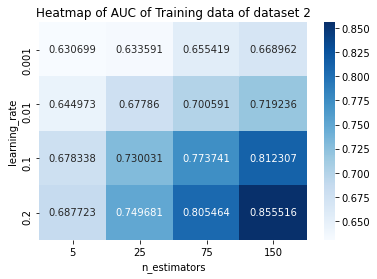

In [75]:
# creating a dataset to plot heatmap of training dataset of set2
train_data_set2 = dataset_creation(z1_set2, index = learning_rate, columns=n_estimators)

# print(train_data_set1)
# plotting the heatmap
plot_heatmap(
    train_data_set2, 
    title='Heatmap of AUC of Training data of dataset 2',
    xlabel='n_estimators',
    ylabel='learning_rate'
)

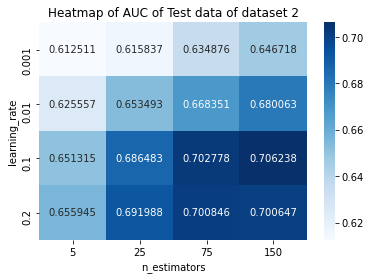

In [76]:
# creating a dataset to plot heatmap of training dataset of set2
test_data_set2 = dataset_creation(z2_set2, index = learning_rate, columns=n_estimators)

# plotting the heatmap
plot_heatmap(
    test_data_set2, 
    title='Heatmap of AUC of Test data of dataset 2',
    xlabel='n_estimators',
    ylabel='learning_rate'
)

<pre><p style="color:#22f;font-family:'Segoe UI';font-size:15px"> Once after you found the best hyper-parameter, you need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.

**finding best parameter**

In [77]:
best_parameter2 = grid_result2.best_params_

In [78]:
best_parameter2

{'learning_rate': 0.1, 'n_estimators': 150}

**Initializing Classifier**

In [79]:
from sklearn.multiclass import OneVsOneClassifier

In [80]:
# used OneVsOneClassifier to get y_score using decision_function()
# In GradientBoostingClassifier 'decision_function' is already given, so no need to use OneVsOneClassifier

best_clf2 = GradientBoostingClassifier(learning_rate=best_parameter2['learning_rate'], n_estimators=best_parameter2['n_estimators'])

**fitting classifier**

In [81]:
%%time
y_score2 = best_clf2.fit(X_train2,y_train2).decision_function(X_test2)
# actually it is score given by decision function

Wall time: 10min 15s


In [82]:
x_score2 = best_clf2.decision_function(X_train2)
# score of training dataset by decision function

In [88]:
# getting fpr, tpr, and thresholds
fpr2_test, tpr2_test, thresholds2_test = roc_curve(y_test2, y_score2)
# getting fpr, tpr, and thresholds for training data
fpr2_train, tpr2_train, thresholds2_train = roc_curve(y_train2, x_score2)

In [89]:
roc_auc_train2 = auc(fpr2_train, tpr2_train) # getting Area Under Curve of train data
roc_auc_test2  = auc(fpr2_test, tpr2_test) # getting AUC of test data

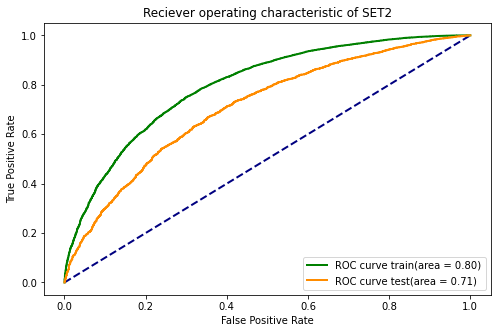

In [90]:
# plotting ROC Curve
# https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html
plt.figure(figsize=(8,5))
plt.plot([0,1],[0,1], color='navy', lw = 2, linestyle='--')
plt.plot(fpr2_train, tpr2_train, color='green', lw=2, label="ROC curve train(area = %0.2f)"%roc_auc_train2)
plt.plot(fpr2_test, tpr2_test, color='darkorange', lw=2, label='ROC curve test(area = %0.2f)'%roc_auc_test2)
plt.title('Reciever operating characteristic of SET2')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc="lower right")

**print the confusion matrix**

In [91]:
from sklearn.metrics import confusion_matrix

In [92]:
y_predicted2 = best_clf2.predict(X_test2)

In [93]:
x_predicted2 = best_clf2.predict(X_train2)

Text(0.5, 1.0, 'confusion matrix of test data of dataset SET2')

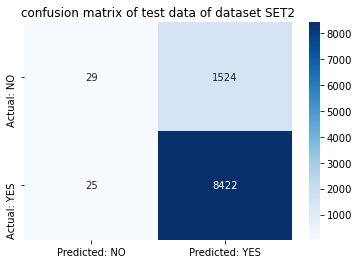

In [94]:
test_cm2 = confusion_matrix(y_test2, y_predicted2)
xlabels = ['Predicted: NO', 'Predicted: YES']
ylabels = ['Actual: NO', 'Actual: YES']
sns.heatmap(
    data=test_cm2,
    xticklabels=xlabels,
    yticklabels=ylabels,
    annot=True,
    fmt='g',
    cmap='Blues'
)
plt.title('confusion matrix of test data of dataset SET2')

Text(0.5, 1.0, 'confusion matrix of train data of dataset SET2')

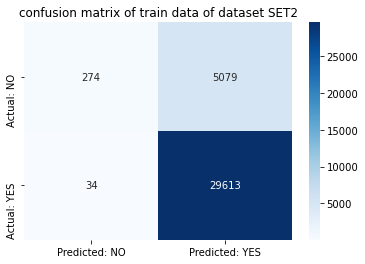

In [95]:
train_cm2 = confusion_matrix(y_train2, x_predicted2)
xlabels = ['Predicted: NO', 'Predicted: YES']
ylabels = ['Actual: NO', 'Actual: YES']
sns.heatmap(
    data=train_cm2,
    xticklabels=xlabels,
    yticklabels=ylabels,
    annot=True,
    fmt='g',
    cmap='Blues'
)
plt.title('confusion matrix of train data of dataset SET2')

#### Getting False positive datapoints of SET2...

In [96]:
# getting false positive data to plot the WordCloud
fp_essay2 = [] # list to store false positive data from the training dataset
fp_price2 = [] # to store price of False positive
fp_teacher_project_posted2= [] # to store teacher_number_of_previously_posted_projects

for i in tqdm(range(len(y_test2))): # for each datapoint in test dataset
    ytest = y_test2[i]
    if ytest[0] == 0 and y_predicted2[i]==1: # checking for false positive
        
        fp_essay2.append(X_test['essay'].iloc[i]) # appending the essay of desired location
        fp_price2.append(X_test['price'].iloc[i]) # appending price
        fp_teacher_project_posted2.append(X_test['teacher_number_of_previously_posted_projects'].iloc[i])
        

100%|█████████████████████████████████████████████████████████████████████████| 10000/10000 [00:00<00:00, 55874.44it/s]


In [97]:
len(fp_essay2)

1524

In [98]:
fp_essay2[0:2]

['play gives children chance practice learning mr rogers teacher low income high poverty area students face many challenges especially classroom students come without eating getting much rest night kindergarten students active energetic ready learn love get move teacher job find way able move learn time exercise really brains physical exercise turns brains john j ratey run jump learn students love move enjoy learning especially movement involved students like choose activities math reading center time noticed huge interest activities allow move move move need get wiggles decided need games allow brains stimulated bodies exercised time better way learn numbers sight words letters jumping hopping marching skipping running nannan',
 'successful children need learn read able read need variety books geared independent reading level amazing first graders attend charter school created teachers parents give children best education possible school curriculum focuses diversity appreciation diffe

In [99]:
# importing necessary modules
from wordcloud import WordCloud, STOPWORDS

stopwords = set(STOPWORDS)

comment_words2 = ''
for essay in fp_essay2: # for each essay
    # joining all essays into single variable called comment_words
    essay = essay + ' ' # adding space at the end of sentence.
    comment_words2 += "".join(essay)+""
    


In [100]:
comment_words2[0:100]

'play gives children chance practice learning mr rogers teacher low income high poverty area students'

### WordCloud

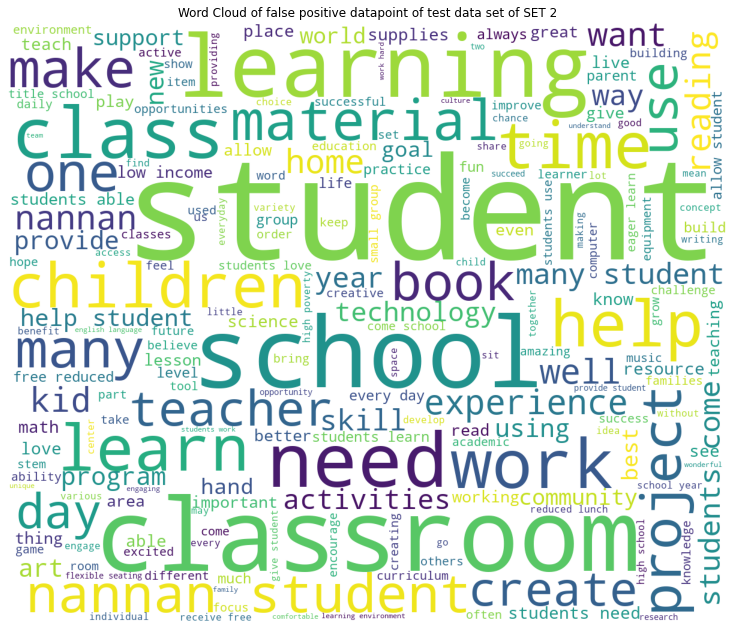

In [101]:
wordcloud2 = WordCloud(width=1200, height=1000,
                     background_color='white',
                     stopwords = stopwords,
                     min_font_size = 10
                     ).generate(comment_words2)

plt.figure(figsize=(10,10), facecolor=None)
plt.imshow(wordcloud2)
plt.axis(False)
plt.tight_layout(pad=0)
plt.title('Word Cloud of false positive datapoint of test data set of SET 2')
plt.show()

### Box-plot

#### Plot the box plot with the 'price' of these false positive data points'

Text(0.5, 1.0, 'Box plot of price of false positive data points of SET2')

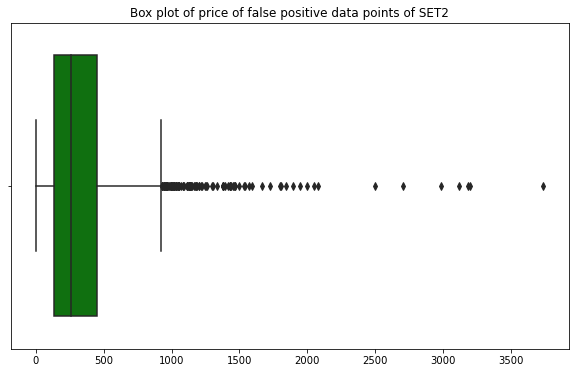

In [102]:
plt.figure(figsize=(10,6))
sns.boxplot(fp_price2,color='green')
plt.title('Box plot of price of false positive data points of SET2')

### PDF(Porbability Density Function)

Text(0, 0.5, 'Probability density')

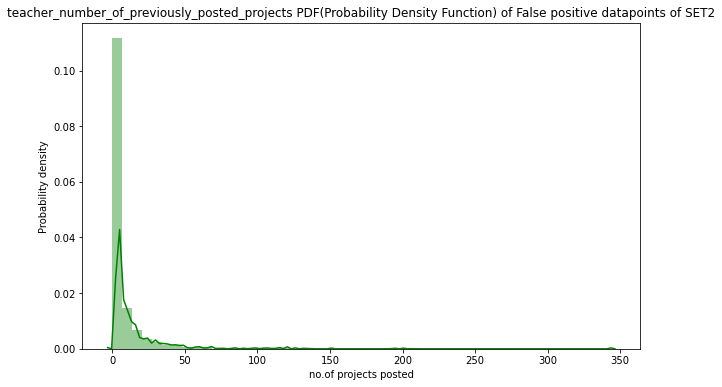

In [103]:
plt.figure(figsize=(10,6))
sns.distplot(fp_teacher_project_posted2,
            color='green',
        )
plt.title('teacher_number_of_previously_posted_projects PDF(Probability Density Function) of False positive datapoints of SET2')
plt.xlabel('no.of projects posted')
plt.ylabel('Probability density')


In [55]:
del X_train2, X_test2, y_train2, y_test2

<pre><h2 style="color:red">SET 1</h2>

In [48]:
from sklearn.ensemble import GradientBoostingClassifier

<pre><b>Hyper parameter tuning on the dataset to find 'depth' and 'min_samples_split'</b></pre>

In [60]:
# learning_rate = [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3] 
learning_rate = [0.01, 0.1, 0.2] 

# n_estimators=[5,10,50, 75, 100, 200]
n_estimators = [50,150,250]

# Because of resource constrained, I just used four values in each hyper-parameter

In [61]:
from sklearn.model_selection import GridSearchCV # GridSearchCV for cross validation

In [62]:
clf_set1 = GradientBoostingClassifier(random_state=43) # initializing Classifier

In [63]:
# making the dictionary of parameters
param_grid = dict(learning_rate = learning_rate, n_estimators=n_estimators)

In [64]:
from sklearn.model_selection import KFold # importing KFold
kfold = KFold(n_splits=5, random_state=42) # initializing object of 10-fold cross-validation

In [65]:
# performing GridSearchCV using 'roc_auc' scoring and also parallelizing the task using n_jobs=-1
grid_search1 = GridSearchCV(clf_set1, param_grid,scoring='roc_auc',n_jobs=-1, cv=kfold)

In [66]:
grid_search1.return_train_score=True # making train score true to get train score

In [67]:
X_train1.shape, y_train1.shape

((5000, 18404), (5000, 1))

In [68]:
X_test1.shape, y_test1.shape

((1000, 18404), (1000, 1))

In [71]:
%%time 
# %%time to track the time taken to fit the classifier
grid_result1 = grid_search1.fit(X_train1,y_train1) # it will take very long time,

Wall time: 5h 24min 51s


> **best parameters**

In [72]:
# best parameter
grid_result1.best_params_

{'learning_rate': 0.01, 'n_estimators': 250}

<p style="font-family:'Segoe UI';background-color:purple;color:white;font-size:16px"><b>We get best parameters as:</b> <br>
    1. max_depth = 10 <br>
    2. min_samples_split = 5

In [73]:
# best score
grid_result1.best_score_

0.6264747018516694

<pre style="color:blue"><b>Tracing the mean and standard deviation test score of auc_score for each hyper parameter

In [74]:
means1 = grid_result1.cv_results_['mean_test_score']
stds1 = grid_result1.cv_results_['std_test_score']
params1 = grid_result1.cv_results_['params']

In [75]:
for mean, stdev, param in zip(means1, stds1, params1):
    print("mean = ",mean," stddev = ",stdev," param = ",param)

mean =  0.6164894973844112  stddev =  0.026725711597812913  param =  {'learning_rate': 0.01, 'n_estimators': 50}
mean =  0.6235571234585031  stddev =  0.02265993571353968  param =  {'learning_rate': 0.01, 'n_estimators': 150}
mean =  0.6264747018516694  stddev =  0.021253453781501168  param =  {'learning_rate': 0.01, 'n_estimators': 250}
mean =  0.6196294534331109  stddev =  0.014552160424060464  param =  {'learning_rate': 0.1, 'n_estimators': 50}
mean =  0.6153547488009492  stddev =  0.0107211235333024  param =  {'learning_rate': 0.1, 'n_estimators': 150}
mean =  0.6103386259846004  stddev =  0.00906175664135123  param =  {'learning_rate': 0.1, 'n_estimators': 250}
mean =  0.6064897727731551  stddev =  0.015451459830312828  param =  {'learning_rate': 0.2, 'n_estimators': 50}
mean =  0.60044308604523  stddev =  0.01411582628825287  param =  {'learning_rate': 0.2, 'n_estimators': 150}
mean =  0.5962296686096341  stddev =  0.010699075798575554  param =  {'learning_rate': 0.2, 'n_estimato

### Plot the result in 3d using plotly

In [76]:
import plotly.offline as offline # to use plotly in offline model
import plotly.graph_objs as go # importing graph objects
offline.init_notebook_mode()  # initialize plotly in notebook mode
import numpy as np

In [77]:
grid_result1.cv_results_ # see the complete description of findings

{'mean_fit_time': array([ 765.58690133, 1522.17530532, 2532.7584712 ,  513.28237004,
        1582.13865027, 2613.9560802 ,  520.88709946, 1596.4479434 ,
        2414.51137304]),
 'std_fit_time': array([129.34992898,  30.22546383,  19.89670043,   5.69198135,
         18.8415261 ,  11.05722253,   3.22984885,  15.29103746,
        420.54576191]),
 'mean_score_time': array([0.39157019, 0.22498341, 0.27185454, 0.20310993, 0.19686093,
        0.2343574 , 0.19686093, 0.21560979, 0.16873846]),
 'std_score_time': array([0.11362823, 0.03217156, 0.10715726, 0.02209557, 0.02724186,
        0.00988069, 0.01874873, 0.0249972 , 0.05710721]),
 'param_learning_rate': masked_array(data=[0.01, 0.01, 0.01, 0.1, 0.1, 0.1, 0.2, 0.2, 0.2],
              mask=[False, False, False, False, False, False, False, False,
                    False],
        fill_value='?',
             dtype=object),
 'param_n_estimators': masked_array(data=[50, 150, 250, 50, 150, 250, 50, 150, 250],
              mask=[False, False

In [83]:
x1_set1 = list(grid_result1.cv_results_['param_learning_rate'])
y1_set1 = list(grid_result1.cv_results_['param_n_estimators'])
z1_set1 = list(grid_result1.cv_results_['mean_train_score']) # accuracy on X_train

x2_set1 = list(grid_result1.cv_results_['param_learning_rate'])
y2_set1 = list(grid_result1.cv_results_['param_n_estimators'])
z2_set1 = list(grid_result1.cv_results_['mean_test_score'])

In [84]:
x1_set1, y1_set1, z1_set1

([0.01, 0.01, 0.01, 0.1, 0.1, 0.1, 0.2, 0.2, 0.2],
 [50, 150, 250, 50, 150, 250, 50, 150, 250],
 [0.7092357562423354,
  0.7867540169232613,
  0.8212503353601764,
  0.879768167637326,
  0.9606091429918469,
  0.9954902735126016,
  0.9189464316183675,
  0.9983129593288304,
  0.9997237654679472])

In [92]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1_set1,y=y1_set1,z=z1_set1, name = 'train')
trace2 = go.Scatter3d(x=x2_set1,y=y2_set1,z=z2_set1, name = 'Cross validation')
data1 = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='learning_rate'),
        yaxis = dict(title='n_estimators'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data1, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

### Let's plot the heatmap 

In [86]:
# creating utility function for plotting heatmap
def plot_heatmap(dataframe, title="Title", xlabel="xlabel", ylabel="ylabel"):
    sns.heatmap(
        data=dataframe,
        annot=True,
        xticklabels=dataframe.columns,
        yticklabels=dataframe.index,
        cmap='Blues',
        fmt='g'
    )
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)

# creating dataset
def dataset_creation(data, index, columns):
    t=np.array(data).reshape(len(index),len(columns))
    
    dataset = pd.DataFrame(t,
                         index=index,
                         columns=columns
                        )
    return dataset

           50        150       250
0.01  0.709236  0.786754  0.821250
0.10  0.879768  0.960609  0.995490
0.20  0.918946  0.998313  0.999724


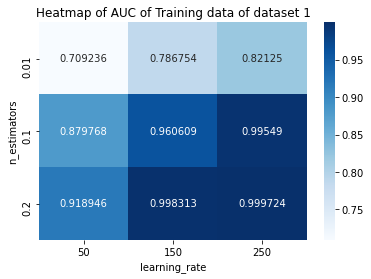

In [93]:
# creating a dataset to plot heatmap of training dataset of set2
train_data_set1 = dataset_creation(z1_set1, index = learning_rate, columns=n_estimators)

print(train_data_set1)
# plotting the heatmap
plot_heatmap(
    train_data_set1, 
    title='Heatmap of AUC of Training data of dataset 1',
    xlabel='learning_rate',
    ylabel='n_estimators'
)

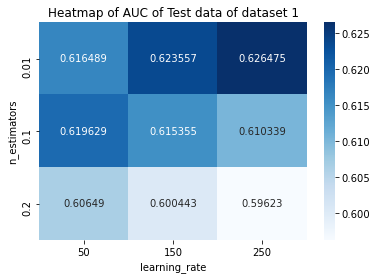

In [94]:
# creating a dataset to plot heatmap of test dataset of set2
test_data_set1 = dataset_creation(z2_set1, index = learning_rate, columns=n_estimators)

# plotting the heatmap
plot_heatmap(
    test_data_set1, 
    title='Heatmap of AUC of Test data of dataset 1',
    xlabel='learning_rate',
    ylabel='n_estimators'
)

<pre><p style="color:#22f;font-family:'Segoe UI';font-size:15px"> Once after you found the best hyper-parameter, you need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.

**finding best parameter**

In [95]:
best_parameter1 = grid_result1.best_params_

In [96]:
best_parameter1

{'learning_rate': 0.01, 'n_estimators': 250}

**Initializing Classifier**

In [97]:
from sklearn.multiclass import OneVsOneClassifier

In [100]:
# used OneVsOneClassifier to get y_score using decision_function()
best_clf1 = GradientBoostingClassifier(n_estimators=best_parameter1['n_estimators'], learning_rate=best_parameter1['learning_rate'])

**fitting classifier**

In [101]:
%%time
y_score1 = best_clf1.fit(X_train1,y_train1).decision_function(X_test1)
# actually it is score given by decision function

Wall time: 33min 36s


In [102]:
x_score1 = best_clf1.decision_function(X_train1)
# score of training dataset by decision function

In [103]:
# help(auc) ############# uncomment to see the description of auc ############

In [107]:
# y_score1 # uncomment this to see the result

In [108]:
# getting fpr, tpr, and thresholds
fpr1_test, tpr1_test, thresholds1_test = roc_curve(y_test1, y_score1)
# getting fpr, tpr, and thresholds for training data
fpr1_train, tpr1_train, thresholds1_train = roc_curve(y_train1, x_score1)

In [109]:
roc_auc_train = auc(fpr1_train, tpr1_train) # getting Area Under Curve of train data
roc_auc_test  = auc(fpr1_test, tpr1_test) # getting AUC of test data

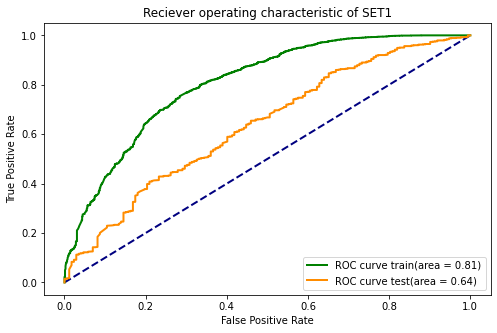

In [110]:
# plotting ROC Curve
# https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html
plt.figure(figsize=(8,5))
plt.plot([0,1],[0,1], color='navy', lw = 2, linestyle='--')
plt.plot(fpr1_train, tpr1_train, color='green', lw=2, label="ROC curve train(area = %0.2f)"%roc_auc_train)
plt.plot(fpr1_test, tpr1_test, color='darkorange', lw=2, label='ROC curve test(area = %0.2f)'%roc_auc_test)
plt.title('Reciever operating characteristic of SET1')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc="lower right")

<pre>
Because of having less data in training, the variance is high.
But, If I would have used more data then there would be less variance.
I didn't use more data because I have been trying for a week but failed many times because of less RAM.
So, finally I decided to use just 5k for training and 1k for test data for SET1.
</pre>

**print the confusion matrix**

In [111]:
from sklearn.metrics import confusion_matrix

In [112]:
y_predicted1 = best_clf1.predict(X_test1)

In [114]:
x_predicted1 = best_clf1.predict(X_train1)

Text(0.5, 1.0, 'confusion matrix of train data of dataset SET1')

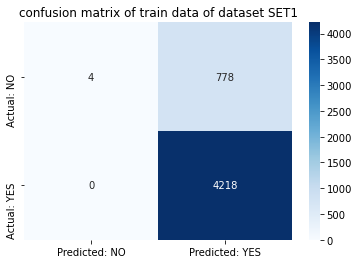

In [115]:
train_cm1 = confusion_matrix(y_train1, x_predicted1)
xlabels = ['Predicted: NO', 'Predicted: YES']
ylabels = ['Actual: NO', 'Actual: YES']
sns.heatmap(
    data=train_cm1,
    xticklabels=xlabels,
    yticklabels=ylabels,
    annot=True,
    fmt='g',
    cmap='Blues'
)
plt.title('confusion matrix of train data of dataset SET1')

Text(0.5, 1.0, 'confusion matrix of test data of dataset SET1')

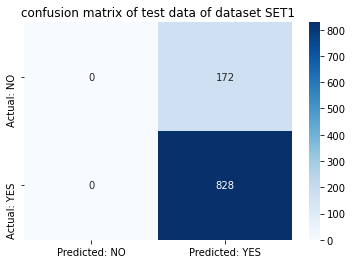

In [116]:
test_cm1 = confusion_matrix(y_test1, y_predicted1)
xlabels = ['Predicted: NO', 'Predicted: YES']
ylabels = ['Actual: NO', 'Actual: YES']
sns.heatmap(
    data=test_cm1,
    xticklabels=xlabels,
    yticklabels=ylabels,
    annot=True,
    fmt='g',
    cmap='Blues'
)
plt.title('confusion matrix of test data of dataset SET1')

#### Getting False positive datapoints of SET1...

In [118]:
# getting false positive data to plot the WordCloud
fp_essay1 = [] # list to store false positive data from the training dataset
fp_price1 = [] # to store price of False positive
fp_teacher_project_posted1= [] # to store teacher_number_of_previously_posted_projects

for i in tqdm(range(len(y_test1))): # for each datapoint in test dataset
    
    if y_test1[i]==0 and y_predicted1[i]==1: # checking for false positive
        
        fp_essay1.append(X_test['essay'].iloc[i]) # appending the essay of desired location
        fp_price1.append(X_test['price'].iloc[i]) # appending price
        fp_teacher_project_posted1.append(X_test['teacher_number_of_previously_posted_projects'].iloc[i])
        

100%|████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 3289.79it/s]


In [119]:
len(fp_essay1)

172

In [120]:
fp_essay1[0:2]

['play gives children chance practice learning mr rogers teacher low income high poverty area students face many challenges especially classroom students come without eating getting much rest night kindergarten students active energetic ready learn love get move teacher job find way able move learn time exercise really brains physical exercise turns brains john j ratey run jump learn students love move enjoy learning especially movement involved students like choose activities math reading center time noticed huge interest activities allow move move move need get wiggles decided need games allow brains stimulated bodies exercised time better way learn numbers sight words letters jumping hopping marching skipping running nannan',
 'successful children need learn read able read need variety books geared independent reading level amazing first graders attend charter school created teachers parents give children best education possible school curriculum focuses diversity appreciation diffe

In [121]:
# importing necessary modules
from wordcloud import WordCloud, STOPWORDS

stopwords = set(STOPWORDS)

comment_words1 = ''
for essay in fp_essay1: # for each essay
    # joining all essays into single variable called comment_words
    essay = essay + ' ' # adding space at the end of sentence.
    comment_words1 += "".join(essay)+""
    


In [122]:
comment_words1[0:100]

'play gives children chance practice learning mr rogers teacher low income high poverty area students'

### WordCloud

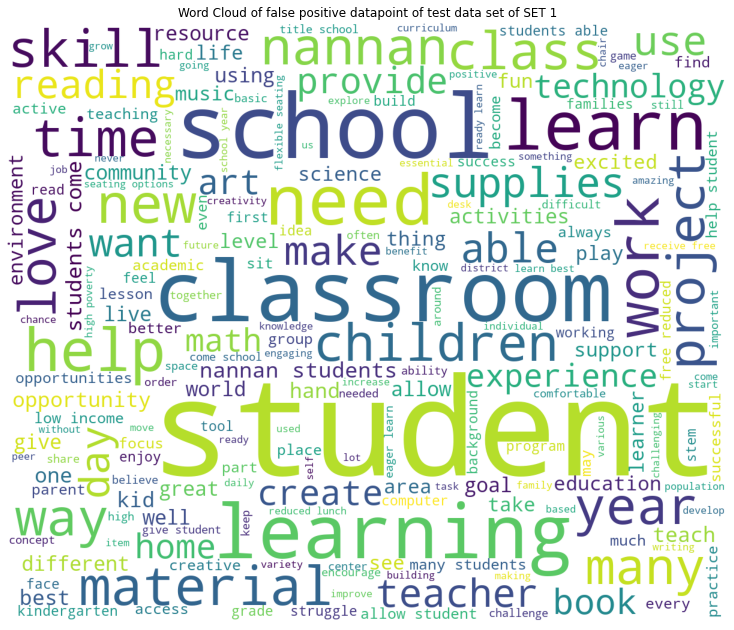

In [123]:
wordcloud1 = WordCloud(width=1200, height=1000,
                     background_color='white',
                     stopwords = stopwords,
                     min_font_size = 10
                     ).generate(comment_words1)

plt.figure(figsize=(10,10), facecolor=None)
plt.imshow(wordcloud1)
plt.axis(False)
plt.tight_layout(pad=0)
plt.title('Word Cloud of false positive datapoint of test data set of SET 1')
plt.show()

### Box-plot

#### Plot the box plot with the 'price' of these false positive data points'

Text(0.5, 1.0, 'Box plot of price of false positive data points of SET1')

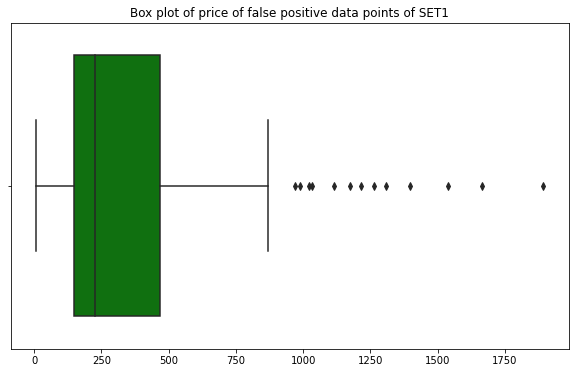

In [124]:
plt.figure(figsize=(10,6))
sns.boxplot(fp_price1,color='green')
plt.title('Box plot of price of false positive data points of SET1')

### PDF(Porbability Density Function)

Text(0, 0.5, 'Probability density')

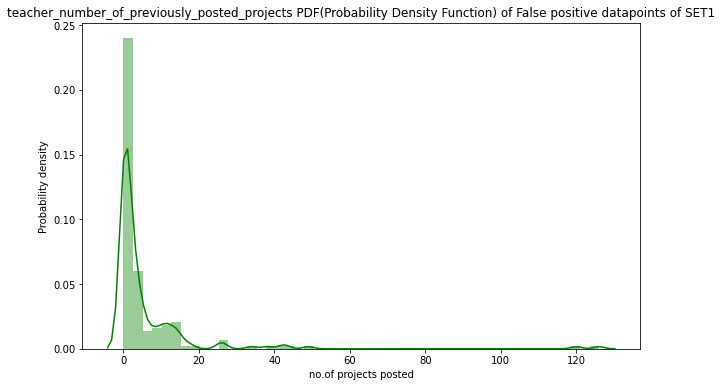

In [125]:
plt.figure(figsize=(10,6))
sns.distplot(fp_teacher_project_posted1,
            color='green',
        )
plt.title('teacher_number_of_previously_posted_projects PDF(Probability Density Function) of False positive datapoints of SET1')
plt.xlabel('no.of projects posted')
plt.ylabel('Probability density')


<h1 style="font-family:'Segoe UI';color:red">Summary:</h1>

In [126]:
from prettytable import PrettyTable

In [127]:
summary = PrettyTable() # creating object of prettytable

In [128]:
summary.field_names = ["Vectorizer", "Model", "learning_rate", "n_estimators","train AUC", "test AUC"]

In [132]:
summary.add_row(["TFIDF", "Gradient Boosting Classifier",best_parameter1['learning_rate'],best_parameter1['n_estimators'], roc_auc_train, roc_auc_test])
summary.add_row(["TFIDF W2V", "Gradient Boosting Classifier", "0.1", "150", "0.80", "0.71"])

In [133]:
# summary.add_row(["TFIDF","DecisionTreeClassifier",grid_result1.best_params_['max_depth'],grid_result1.best_params_['min_samples_split'],"%.2f"%grid_result1.best_score_])
# summary.add_row(["TFIDF W2V","DecisionTreeClassifier", grid_result2.best_params_['max_depth'],grid_result2.best_params_['min_samples_split'],"%.2f"%grid_result2.best_score_])

In [134]:
print(summary)

+------------+------------------------------+---------------+--------------+--------------------+--------------------+
| Vectorizer |            Model             | learning_rate | n_estimators |     train AUC      |      test AUC      |
+------------+------------------------------+---------------+--------------+--------------------+--------------------+
|   TFIDF    | Gradient Boosting Classifier |      0.01     |     250      | 0.8068110848767733 | 0.6368596225143243 |
| TFIDF W2V  | Gradient Boosting Classifier |      0.1      |     150      |        0.80        |        0.71        |
+------------+------------------------------+---------------+--------------+--------------------+--------------------+
